In [1]:
import scanpy as sc
import scFates as scf
sc.set_figure_params()
scf.set_figure_pubready()
adata=sc.read("data/adata_SCtraj_scenic.h5ad")

In [2]:
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import cm, colors

tab_10 = list(map(colors.to_hex, cm.tab10.colors))

tabs=list(map(lambda t: LinearSegmentedColormap.from_list(name="tab",colors=["white",t]),tab_10))

dct_cmap=dict(zip(adata.var.fit_clusters.unique(),tabs))
dct_col=dict(zip(adata.var.fit_clusters.unique(),tab_10))

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from typing import Union, Iterable

def plot_modules(adata,
                 color: Union[str,None]=None,
                 annot_mil: Iterable = [],
                 kde_kwargs: dict = {},
                 lineplot_kargs: dict = {},
                 figsize=(10,5),
                 ax=None):
    fitted=pd.DataFrame(adata.layers["fitted"],index=adata.obs_names,columns=adata.var_names)
    fitted=fitted.apply(lambda x: (x-x.mean())/x.std(),axis=0)
    df_reg=pd.concat(list(map(lambda c: fitted.loc[adata.obs.t.sort_values().index,adata.var.fit_clusters==c].mean(axis=1),adata.var.fit_clusters.unique())),
              keys=adata.var.fit_clusters.unique()).reset_index()
    df_reg.columns=["cluster","cell","activity"]
    for c in df_reg.cluster.unique():
        df_reg.loc[df_reg.cluster==c,'activity']=(df_reg.loc[df_reg.cluster==c,'activity']-df_reg.loc[df_reg.cluster==c,'activity'].min())/(df_reg.loc[df_reg.cluster==c,'activity'].max()-df_reg.loc[df_reg.cluster==c,'activity'].min())
    df_reg["pseudotime"]=[adata.obs.t[c] for c in df_reg.cell]
    
    
    
    
    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=figsize,constrained_layout=True)
    if color is not None:
        df=pd.concat(list(map(lambda i:pd.DataFrame({color:adata.obs[color].cat.categories[i],
                     "pseudotime":adata[adata.obs[color]==adata.obs[color].cat.categories[i]].obs.t}),
             range(len(adata.obs[color].cat.categories)))))
        sns.kdeplot(data=df, x="pseudotime", hue=color, multiple="fill",
                   palette=sns.color_palette(adata.uns[color+"_colors"]),
                legend=False,ax=ax,**kde_kwargs)
        ax.set_xlim([0,adata.obs.t.max()])
    sns.lineplot(data=df_reg,x="pseudotime",y="activity",hue="cluster",ax=ax,palette=dct_col,lw=3,
                 **lineplot_kargs)
    plt.grid(b=False)
    
    for m in annot_mil:
        mid=adata.obs.loc[adata.obs["old_milestones"]==m,"t"].mean()
        ax.axvline(mid,linestyle="--",color="k")

        ax.annotate(m, 
                    xy=(mid, 1), 
                    xytext=(mid, 1.02), 
                    horizontalalignment ="left",
                    va="bottom",
                    rotation=45,
                    fontsize=12)
    
    return ax


/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
<ipython-input-3-effd0fcdb026>:37: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  plt.grid(b=False)


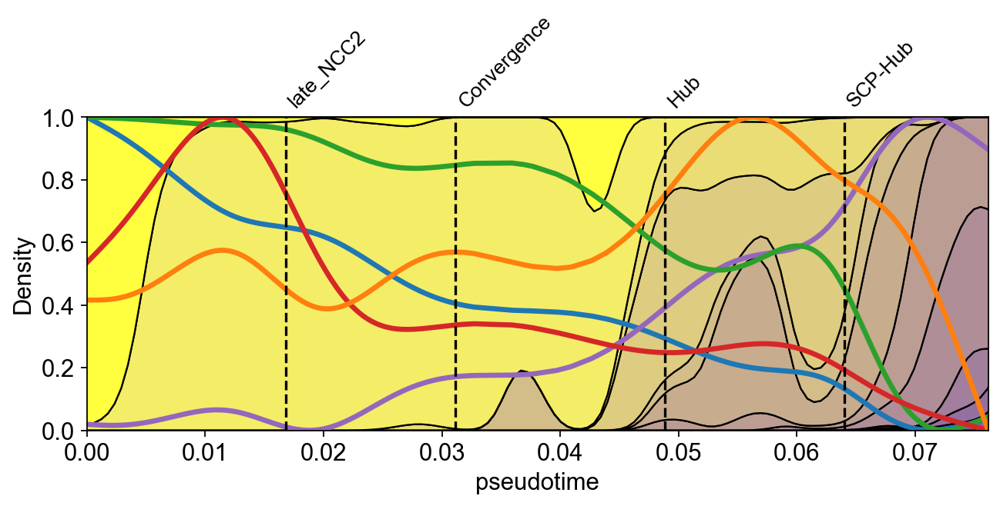

In [4]:
plot_modules(adata,"devtime",annot_mil=['late_NCC2', 'Convergence', 'Hub', 'SCP-Hub'],
            lineplot_kargs=dict(legend=False),figsize=(8,4))
plt.savefig("figures/fig3_modules.pdf")

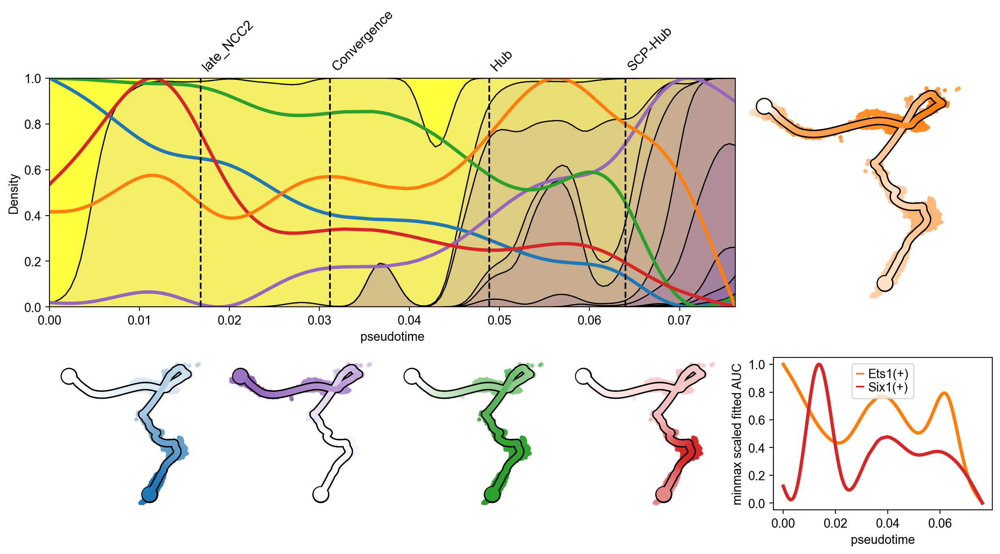

In [5]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import scvelo as scv
scv.set_figure_params(figsize=(3.5,3.5))

fig,axs=plt.subplots(2,5,figsize=(12.5,7),tight_layout=True,
                     gridspec_kw=dict(width_ratios=[1,1,1,1,1.5],height_ratios=[1.5,1],wspace=0))

gs = axs[0,0].get_gridspec()
for ax in axs[0, :-1]:
    ax.remove()
    

axbig = fig.add_subplot(gs[0, :-1])
plot_modules(adata,"devtime",annot_mil=['late_NCC2', 'Convergence', 'Hub', 'SCP-Hub'],
            lineplot_kargs=dict(legend=False),ax=axbig)

for c in range(4):
    scf.pl.trends(adata,cluster=c,
                  cmap=dct_cmap[c],
                  feature_cmap=dct_cmap[c]
                ,plot_heatmap=False,frameon=False,axemb=axs[1,c])
    
#ax2 = fig.add_subplot(gs[:, -1])
c=c+1
scf.pl.trends(adata,cluster=c,
                  cmap=dct_cmap[c],
                  feature_cmap=dct_cmap[c]
                ,plot_heatmap=False,frameon=False,axemb=axs[0,c])




import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
# https://scholarcommons.sc.edu/cgi/viewcontent.cgi?article=5306&context=etd 
# pdf page 98  manuscript page 80
ax=axs[1,4]
def get_reg(g,adata):
    df = pd.DataFrame({"t":adata.obs.t,
              "fitted":adata[:,g].layers["fitted"].flatten(),
              "expr":adata[:,g].X.flatten(),
             "regulon":g})
    scaler = MinMaxScaler()
    scaler.fit(df.fitted.values.reshape(-1, 1))
    df["norm"]=scaler.transform(df.fitted.values.reshape(-1, 1))
    return df
    
l=[get_reg(r,adata) for r in ["Ets1(+)","Six1(+)"]]

l=pd.concat(l)

import seaborn as sns
#fig, ax = plt.subplots(figsize=(4.5,2.5),constrained_layout=True)
sns.lineplot(data=l,x="t",y="norm",hue="regulon",linewidth=3,palette=[dct_col[4],dct_col[3]],ax=ax)
ax.grid(b=False)
ax.set_xlabel("pseudotime")
ax.set_ylabel("minmax scaled fitted AUC")
ax.legend(labelspacing=0.1)
#plt.margins(0.2, 0.1)
#plt.savefig("figures/Ets1_Six1.png",dpi=600)



divider1 = make_axes_locatable(ax)
cax1 = divider1.append_axes('left', size='10%', pad=0.2)
cax1.axis("off")

#plt.tight_layout()
plt.savefig("figures/fig3_A.pdf",bbox_inches="tight")

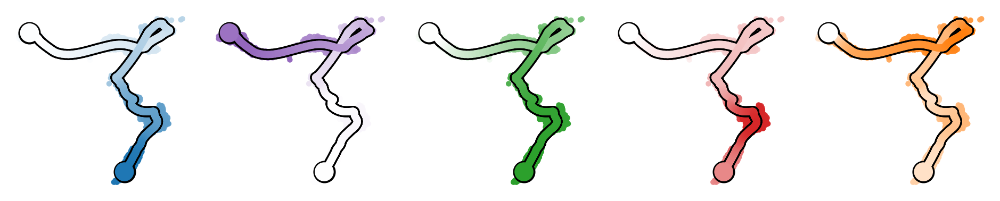

In [6]:
fig, axs=plt.subplots(1,5,figsize=(12,12),gridspec_kw=dict(wspace=0.01))
for c in range(5):
    scf.pl.trends(adata,cluster=c,
                  cmap=dct_cmap[c],
                  feature_cmap=dct_cmap[c]
                ,plot_heatmap=False,frameon=False,axemb=axs[c])
    
plt.savefig("figures/fig3_metaregulons.pdf")

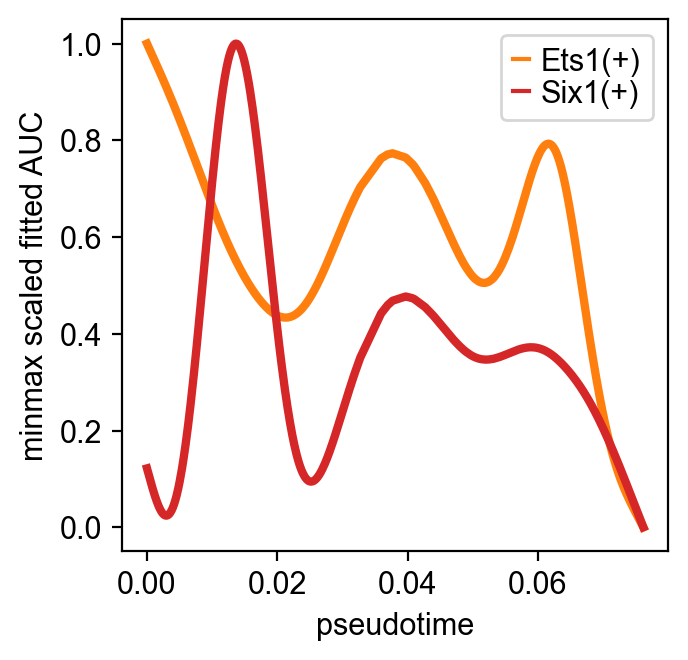

In [7]:
ax=sns.lineplot(data=l,x="t",y="norm",hue="regulon",linewidth=3,palette=[dct_col[4],dct_col[3]])
ax.grid(b=False)
ax.set_xlabel("pseudotime")
ax.set_ylabel("minmax scaled fitted AUC")
ax.legend(labelspacing=0.1)
plt.savefig("figures/fig3_ets1six1.pdf")

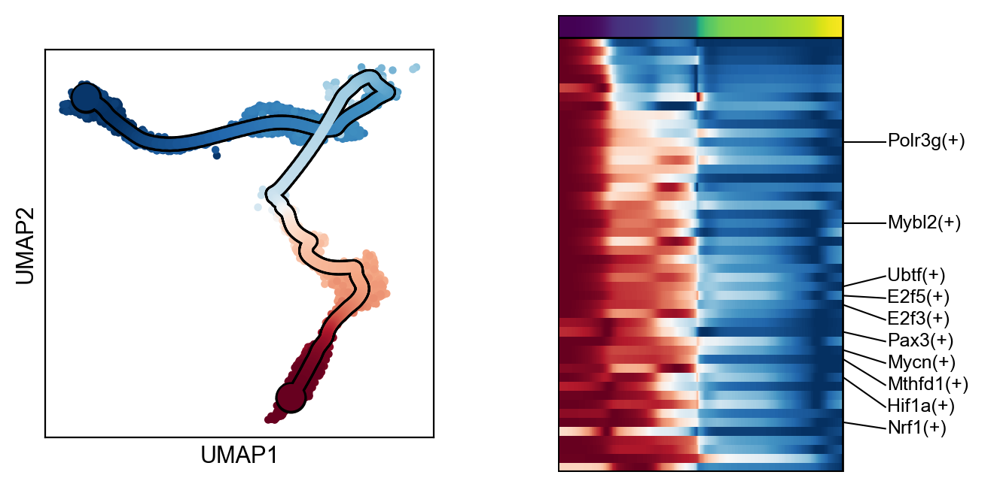

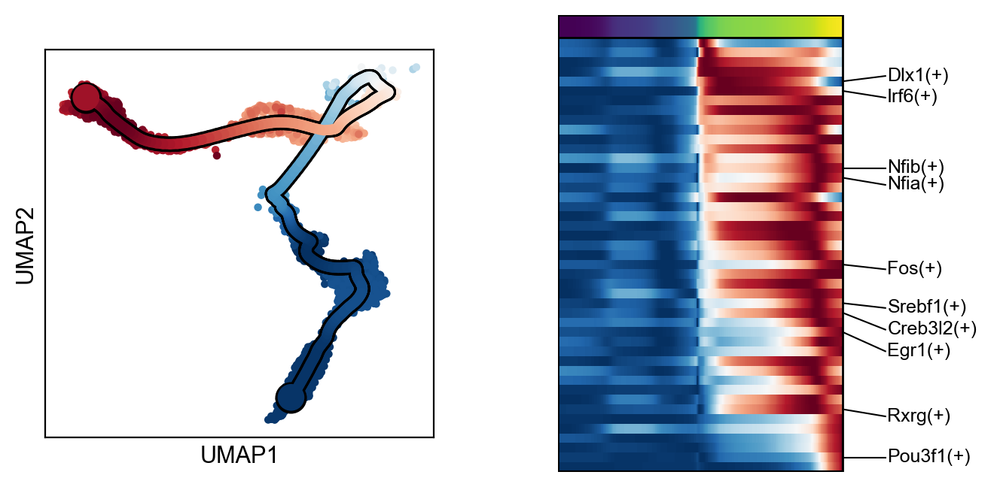

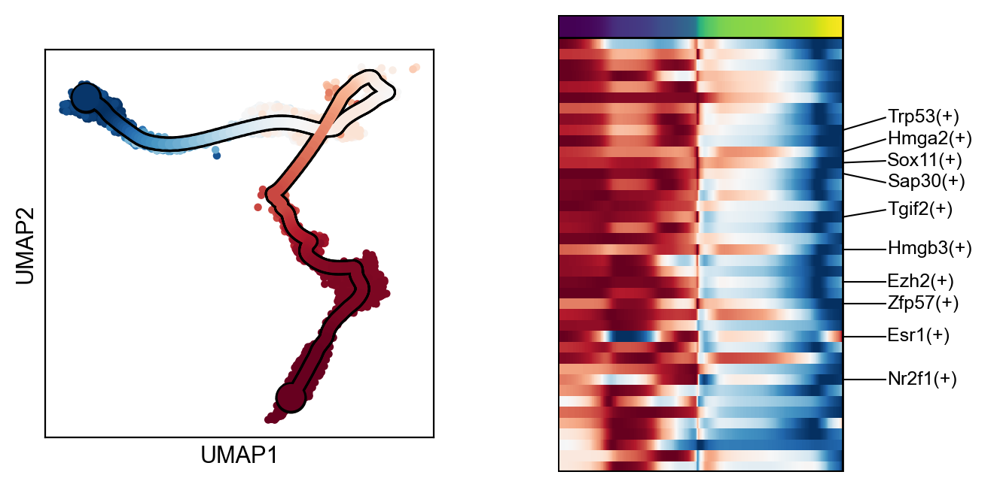

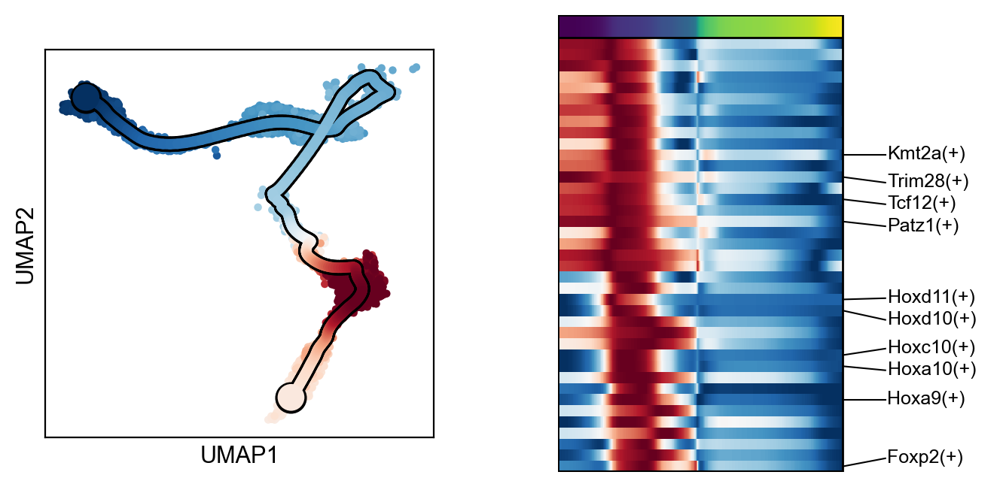

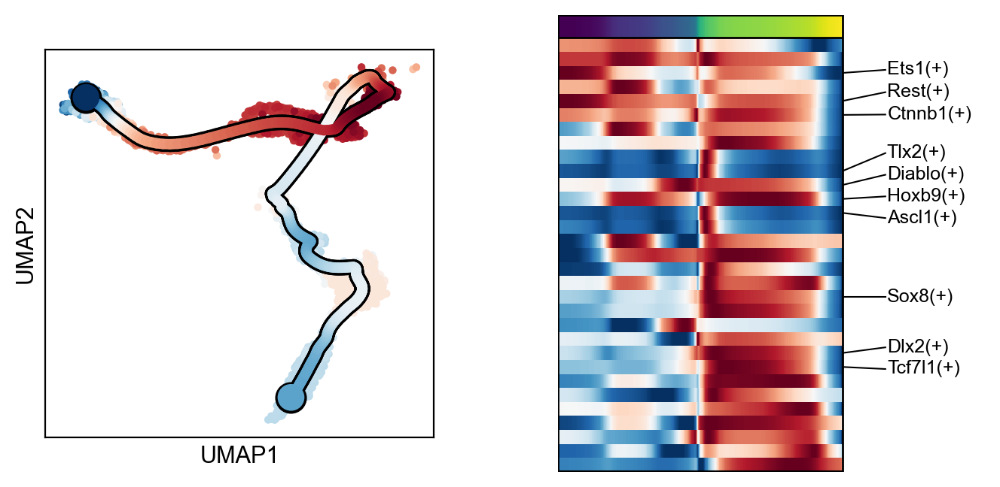

In [8]:
genes0=scf.pl.trends(adata,cluster=0,return_genes=True)
genes1=scf.pl.trends(adata,cluster=1,return_genes=True)
genes2=scf.pl.trends(adata,cluster=2,return_genes=True)
genes3=scf.pl.trends(adata,cluster=3,return_genes=True)
genes4=scf.pl.trends(adata,cluster=4,return_genes=True)

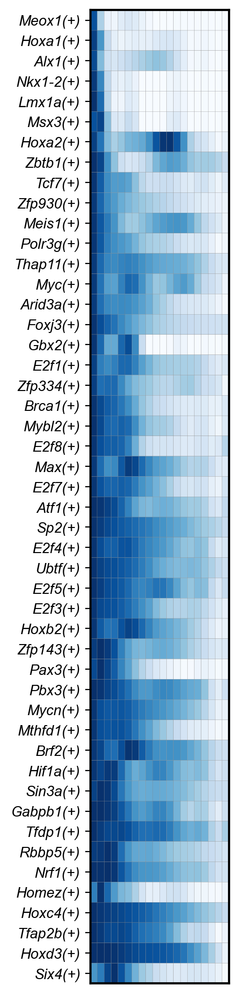

In [9]:
)
df=scf.pl.matrix(adata,genes0,cmap="Blues",save="clu0.pdf",return_data=True,**matrix_params)

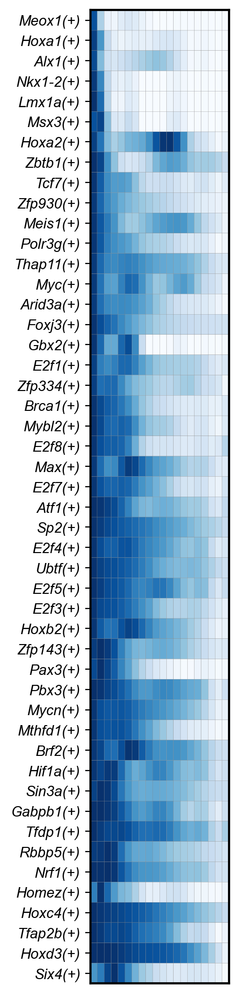

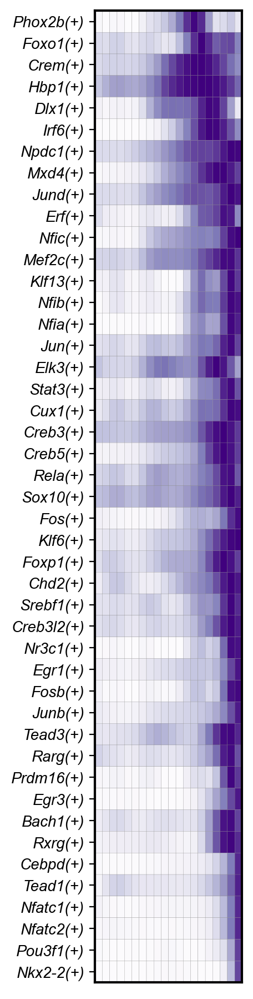

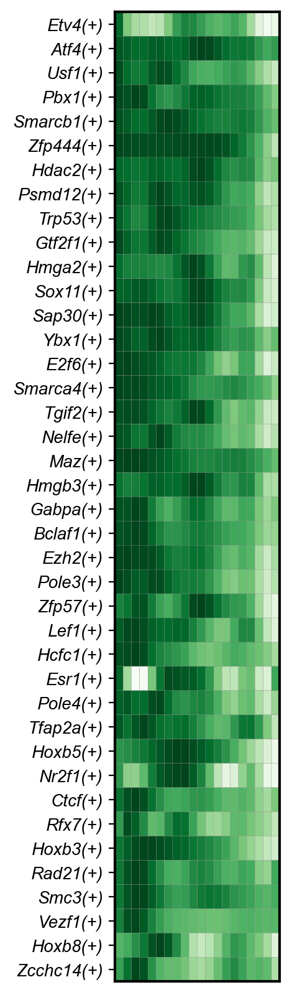

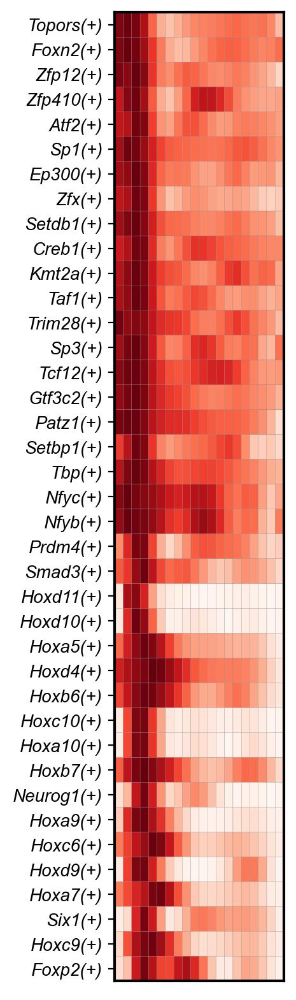

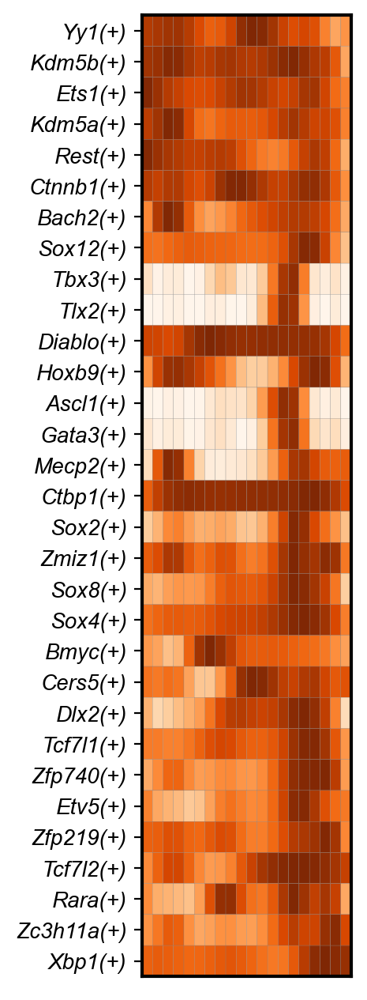

In [14]:
dfs=list()
matrix_params=dict(nbins=20,feature_style="italic",annot_top=False,colorbar=False,return_data=True)
for i,cm in enumerate(["Blues","Purples","Greens","Reds","Oranges"]):
    dfs.append(eval(f"scf.pl.matrix(adata,genes{i},cmap=cm,save='clu{i}.pdf',**matrix_params)")['NCC->imSC'])

In [15]:
with pd.ExcelWriter('data.xlsx') as writer:  

    df1.to_excel(writer, sheet_name='Sheet_name_1')

    df2.to_excel(writer, sheet_name='Sheet_name_2')

[           (-7.61e-05, 0.00381]  (0.00381, 0.00762]  (0.00762, 0.0114]  \
 Meox1(+)               0.872454            0.329099           0.067448   
 Hoxa1(+)               0.940211            0.605921           0.248374   
 Alx1(+)                0.895007            0.441526           0.204173   
 Nkx1-2(+)              0.957210            0.664723           0.269455   
 Lmx1a(+)               0.988833            0.771749           0.284348   
 Msx3(+)                0.873638            0.918002           0.423239   
 Hoxa2(+)               0.938223            0.736851           0.445648   
 Zbtb1(+)               0.992802            0.918345           0.625026   
 Tcf7(+)                0.976945            0.826121           0.643042   
 Zfp930(+)              0.963132            0.790525           0.652246   
 Meis1(+)               0.973315            0.847120           0.717662   
 Polr3g(+)              0.976429            0.843063           0.699165   
 Thap11(+)              0

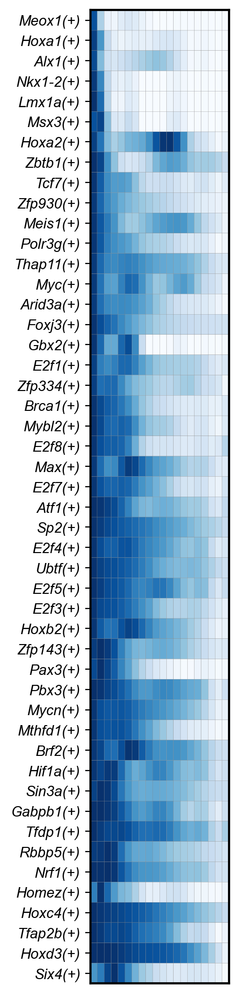

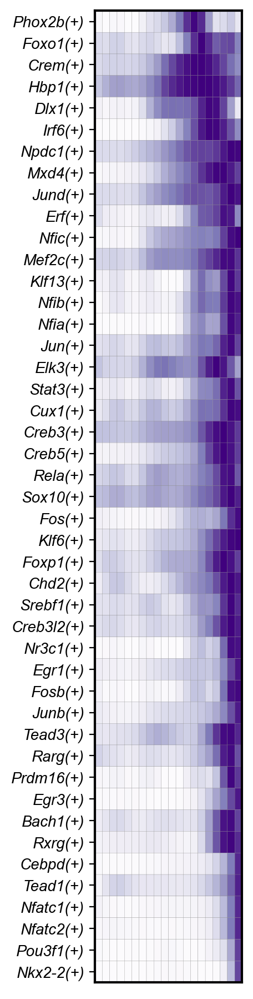

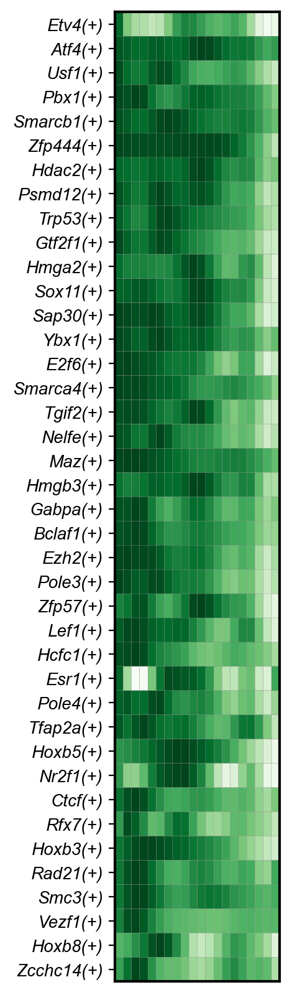

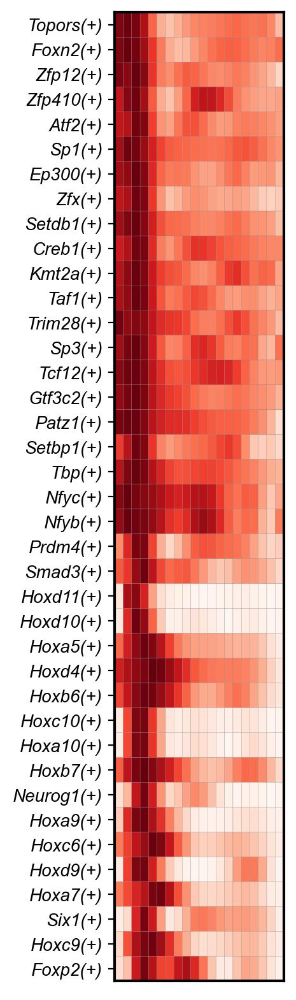

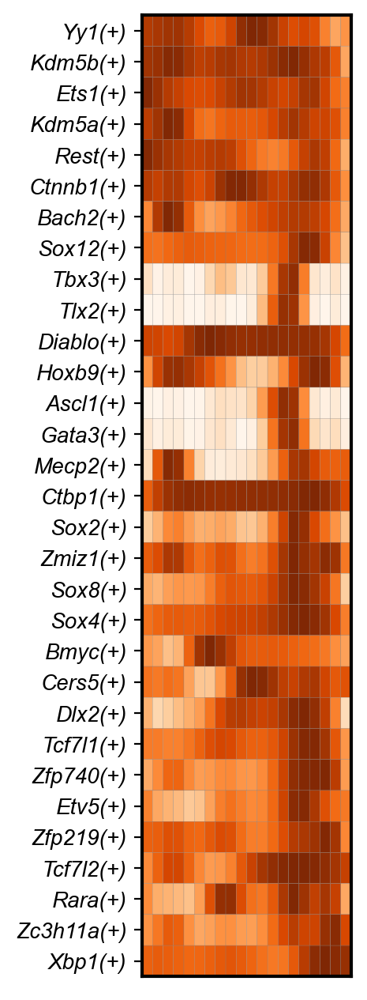

In [9]:
matrix_params=dict(nbins=20,feature_style="italic",annot_top=False,colorbar=False)
scf.pl.matrix(adata,genes0,cmap="Blues",save="clu0.pdf",**matrix_params)
scf.pl.matrix(adata,genes1,cmap="Purples",**matrix_params,save="clu1.pdf")
scf.pl.matrix(adata,genes2,cmap="Greens",**matrix_params,save="clu2.pdf")
scf.pl.matrix(adata,genes3,cmap="Reds",**matrix_params,save="clu3.pdf")
scf.pl.matrix(adata,genes4,cmap="Oranges",**matrix_params,save="clu4.pdf")

In [10]:
regulon = pd.read_csv("scenic/regulon_mat.csv",index_col=0)

In [11]:
ets1=regulon.columns[regulon.loc["Ets1(+)"]==1]
six1=regulon.columns[regulon.loc["Six1(+)"]==1]

In [12]:
adata_all=sc.read("data/adata_tree.h5ad")

In [13]:
adata_all.var=pd.read_csv("data/stat_assoc_NCC->nmSC<>mSC.csv",index_col=0)

In [14]:
adata_all.var["Six1"]=adata_all.var_names.isin(six1)
adata_all.var["Ets1"]=adata_all.var_names.isin(ets1)

In [15]:
six1=adata_all.var_names[adata_all.var.Six1 & adata_all.var.signi ]
ets1=adata_all.var_names[adata_all.var.Ets1 & adata_all.var.signi ]

In [16]:
scf.tl.slide_cells(adata_all,"NCC2",["nmSC<>mSC"],win=300)

--> added 
    .uns['NCC2->nmSC<>mSC']['cell_freq'], probability assignment of cells on 7 non intersecting windows.


In [17]:
scf.tl.slide_cors(adata_all,"NCC2",["nmSC<>mSC"],
                  genesetA=ets1,genesetB=six1)

--> added 
    .uns['NCC2->nmSC<>mSC']['corAB'], gene-gene correlation modules.


In [18]:
df=pd.DataFrame(adata_all.uns['NCC2->nmSC<>mSC']['corAB'])

In [19]:
six1=df.loc["genesetB"].A.index[(df.loc["genesetB"].A["1"]<-0.005) & (df.loc["genesetB"].B["1"]>0.005)]

In [20]:
ets1=df.loc["genesetA"].A.index[(df.loc["genesetA"].B["1"]<-0.005) & (df.loc["genesetA"].A["1"]>0.005)]

In [21]:
scf.tl.slide_cors(adata_all,"NCC2",["nmSC<>mSC"],
                  genesetA=ets1,genesetB=six1)

--> added 
    .uns['NCC2->nmSC<>mSC']['corAB'], gene-gene correlation modules.


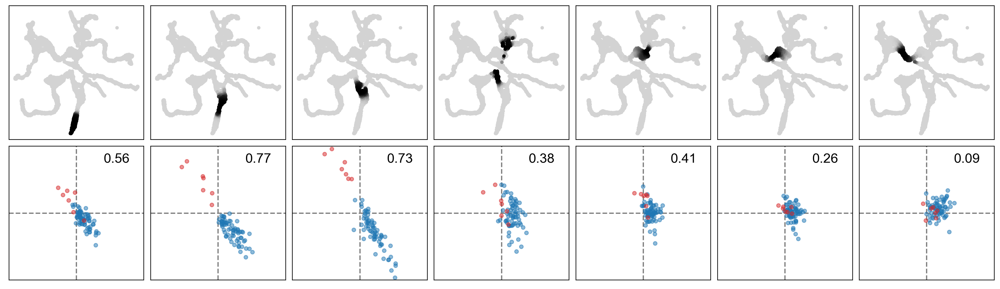

In [22]:
scf.pl.slide_cors(adata_all,"NCC2",["nmSC<>mSC"])

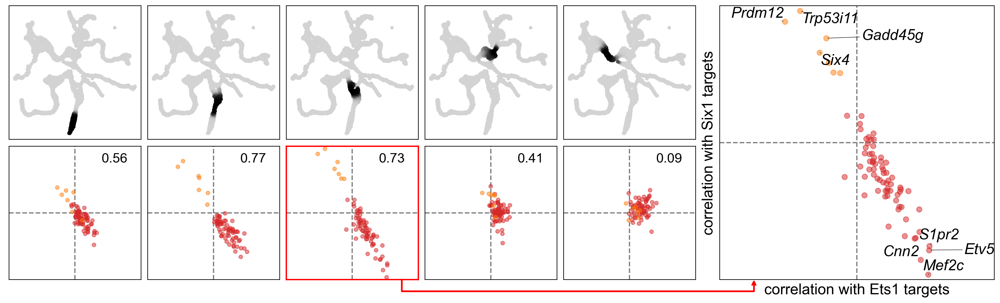

In [23]:
scf.pl.slide_cors(adata_all,"NCC2",["nmSC<>mSC"],focus=2,labels=("Ets1 targets","Six1 targets"),win_keep=[0,1,2,4,6],col=["tab:red","tab:orange"],
           kwargs_text=dict(fontsize=18,style="italic"),kwargs_adjust=dict(arrowprops=dict(arrowstyle="-", color='k', lw=0.5)),save="_ets1six1targets.pdf")

In [24]:
cellfreq=adata_all.uns["NCC2->nmSC<>mSC"]["cell_freq"][2]
cells=cellfreq.index[cellfreq>.9]

In [25]:
plate=[c[0] for c in cells.str.split(":")]

In [26]:
plate=pd.Series(plate,index=cells)

In [27]:
plate.value_counts()

SS2_19_372    41
SS2_20_083    38
SS2_18_108    26
SS2_18_109    20
SS2_18_107    14
SS2_17_433     5
SS2_16_769     4
SS2_17_432     3
dtype: int64

In [28]:
adata_all.uns["NCC2->nmSC<>mSC"]["cell_freq"].append(pd.Series(cellfreq.index.isin(plate[plate=="SS2_19_372"].index)*1,index=cellfreq.index))
adata_all.uns["NCC2->nmSC<>mSC"]["cell_freq"].append(pd.Series(cellfreq.index.isin(plate[plate=="SS2_20_083"].index)*1,index=cellfreq.index))
adata_all.uns["NCC2->nmSC<>mSC"]["cell_freq"].append(pd.Series(cellfreq.index.isin(plate[plate=="SS2_18_108"].index)*1,index=cellfreq.index))

In [32]:
adata_all.uns["NCC2->nmSC<>mSC"]["cell_freq"].append(pd.Series(cellfreq.index.isin(plate[plate=="SS2_18_109"].index)*1,index=cellfreq.index))

In [33]:
scf.tl.slide_cors(adata_all,"NCC2",["nmSC<>mSC"],
                  genesetA=ets1,genesetB=six1)

--> added 
    .uns['NCC2->nmSC<>mSC']['corAB'], gene-gene correlation modules.


Text(-2.65, 1.2, 'plate SS2_19_372')

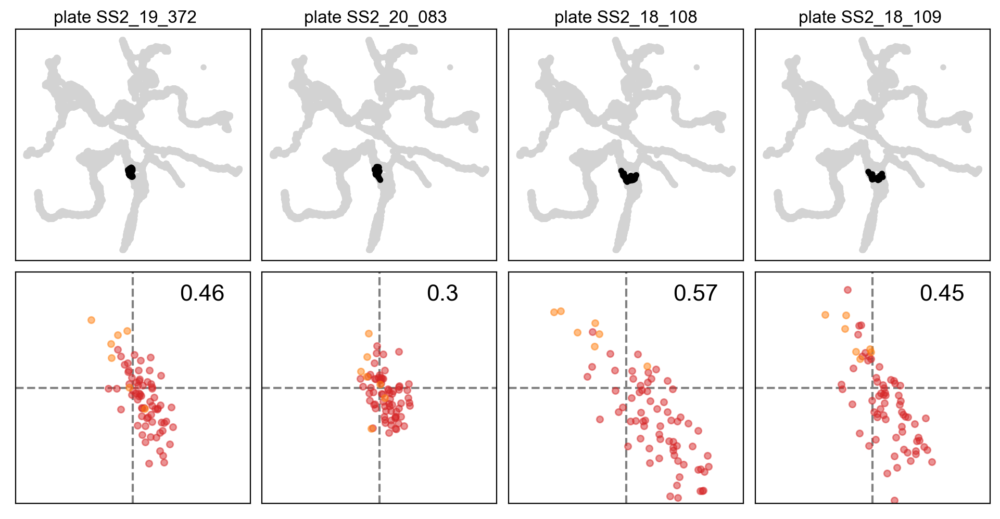

In [66]:
axs=scf.pl.slide_cors(adata_all,"NCC2",["nmSC<>mSC"],win_keep=[7,8,9,10],col=["tab:red","tab:orange"],show=False)
plt.text(-.18-.06,1.2,"plate SS2_18_109")

plt.text(-.97-.06,1.2,"plate SS2_18_108")

plt.text(-1.78-.06,1.2,"plate SS2_20_083")

plt.text(-2.59-.06,1.2,"plate SS2_19_372")

In [24]:
fname="fig5"

In [25]:
%%bash -s $fname
cat<<EOF >$1.tex
\documentclass[11pt]{article}
\usepackage[paperheight=217mm,paperwidth=180mm]{geometry}
 \geometry{
 left=5mm,
 right=5mm,
 top=5mm,
 bottom=5mm,
 }

\usepackage[labelfont=bf]{caption}
\usepackage{multirow}
\usepackage[rgb]{xcolor}
\usepackage{fontspec}
\usepackage[utf8]{inputenc}
\usepackage[T1]{fontenc}
\usepackage{graphicx} 
\begin{document}
\setmainfont{Arial}

\definecolor{Blue}{RGB}{50, 49, 145}

\noindent
\scriptsize 

\begin{minipage}[!ht]{0.3\textwidth}
\vspace{0cm}
\raggedright \textbf{A} \textcolor{Blue}{Trajectory from NCC to SC}
\includegraphics[width=1\textwidth]{figures/SC_sel.pdf}
\end{minipage}\hfill
\begin{minipage}[!ht]{0.45\textwidth}
\vspace{0cm}
\raggedright \textbf{B} \textcolor{Blue}{Meta-regulon analysis}
\includegraphics[width=1\textwidth]{figures/fig3_modules.pdf}
\includegraphics[width=1\textwidth]{figures/fig3_metaregulons.pdf}
\end{minipage}\hfill
\begin{minipage}[!ht]{0.2\textwidth}

\end{minipage}\hfill

\raggedright \textbf{C} \textcolor{Blue}{Ets1 vs Six1 target correlation over trajectory from NCC to imSC}

\begin{minipage}[!ht]{0.24\textwidth}
\includegraphics[width=1\textwidth]{figures/fig3_ets1six1.pdf}
\end{minipage}\hfill
\begin{minipage}[!ht]{0.75\textwidth}
\includegraphics[width=1\textwidth]{figures/slide_cors_ets1six1targets.pdf}
\end{minipage}\hfill



\hfill
\clearpage


EOF

echo "\end{document}" >> $1.tex

xelatex --shell-escape $1.tex
rm $1.tex
convert -flatten -density 300 $1.pdf $1.jpg
identify $1.pdf

This is XeTeX, Version 3.14159265-2.6-0.999991 (TeX Live 2019/Debian) (preloaded format=xelatex)
 \write18 enabled.
entering extended mode
(./fig3.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size11.clo))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption.sty
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption3.sty))
(/usr/share/texlive/texmf-dist/tex/latex/multirow/multirow.sty)
(/usr/share/texlive/texmf-dist/tex/latex/xcolor/xcolor.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics-cfg/color.cfg)
(/usr/share/texlive/texmf-dist/t

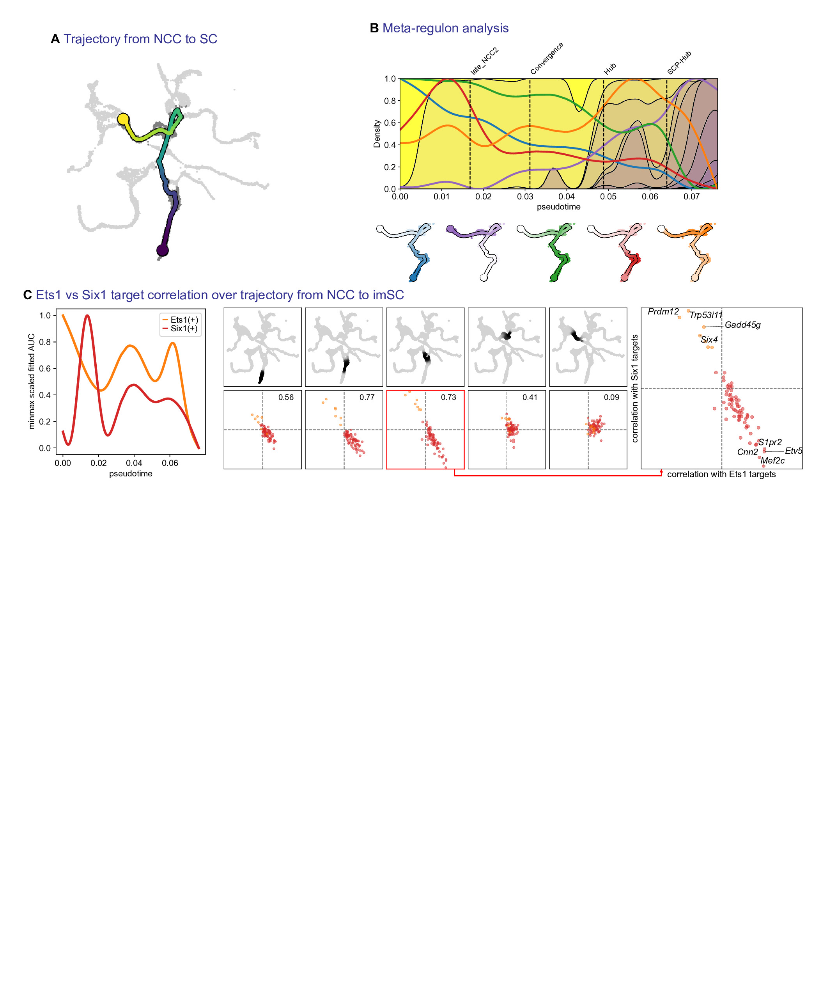

In [26]:
from IPython.display import Image
Image(filename=fname+'.jpg') 

... storing 'sel' as categorical


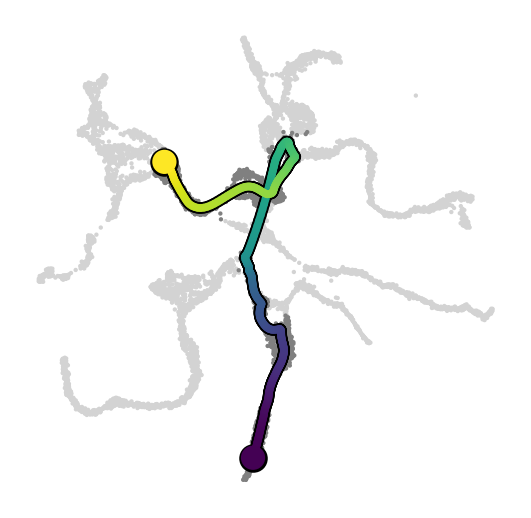

In [27]:
sc.set_figure_params(frameon=False)
adata_all.obs["sel"]=adata_all.obs_names.isin(adata.obs_names).astype(str)
ax=sc.pl.umap(adata_all,color="sel",groups="True",show=False,legend_loc="none",palette=["grey","grey"])
scf.pl.trajectory(adata,alpha=0,ax=ax,scale_path=.7,show=False,)
plt.savefig("figures/SC_sel.pdf",bbox_inches="tight")

In [28]:
adata=sc.read("data/adata_bif_sensory1.h5ad")

In [29]:
adata_all.obs["sel"]=adata_all.obs_names.isin(adata.obs_names).astype(str)

... storing 'sel' as categorical


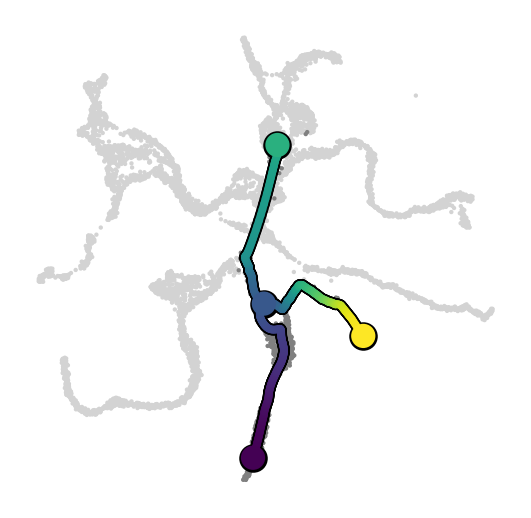

In [30]:
sc.set_figure_params(frameon=False)
ax=sc.pl.umap(adata_all,color="sel",groups="True",show=False,legend_loc="none")
scf.pl.trajectory(adata,alpha=0,ax=ax,scale_path=.7,show=False)
plt.savefig("figures/sens1_bif_sel.pdf",bbox_inches="tight")

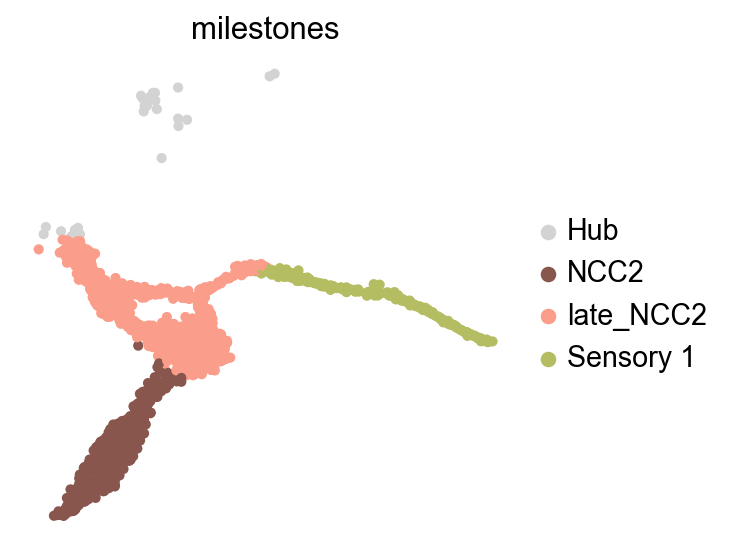

In [31]:
sc.pl.umap(adata,color="milestones",palette=["lightgrey","#88564C","#fa9e8b","#B5BD63"])

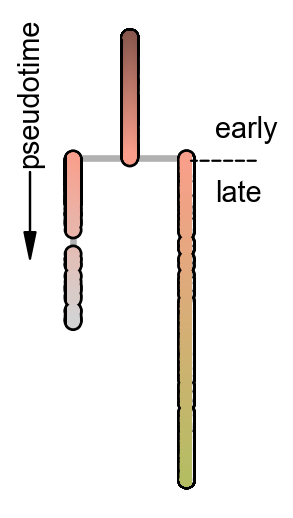

In [32]:
sc.set_figure_params(figsize=(1,4))
ax=scf.pl.dendrogram(adata,color_milestones=True,s=100,frameon=False,
                  add_outline=True,clip_on=False,tree_behind=True,show=False)
ax.annotate("pseudotime",(-.3,.5),(-.3,.7),xycoords="axes fraction",rotation=90,horizontalalignment='center',size=13,
            arrowprops=dict(facecolor="black",width=.1,headwidth=5))


ax.annotate("",(2,-0.021026),(3.3,-0.021026),xycoords="data",rotation=90,horizontalalignment='center',size=13,
                arrowprops=dict(facecolor="black",arrowstyle="-",linestyle="--"))

ax.annotate("early",(2,-0.011026),(2.5,-0.017026),xycoords="data",horizontalalignment='left',size=13)

ax.annotate("late",(2,-0.021026),(2.5,-0.028026),xycoords="data",horizontalalignment='left',size=13)

plt.savefig("figures/fig3_bif1miles.pdf")

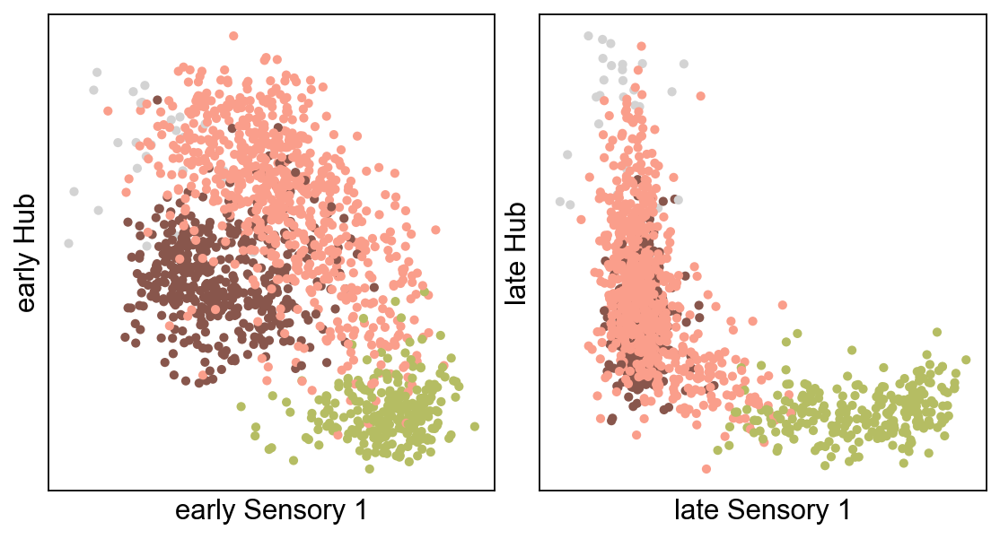

In [33]:
sc.set_figure_params()
r="NCC2"
mils=["Sensory 1","Hub"]
scf.pl.modules(adata,r,mils,save="bif_sens1.pdf")

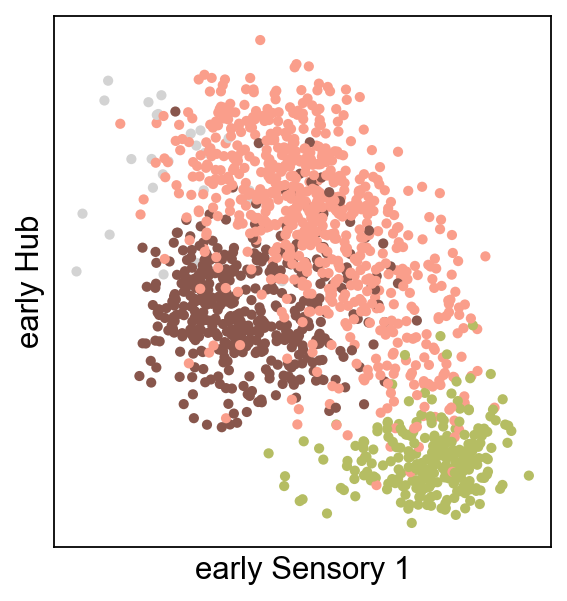

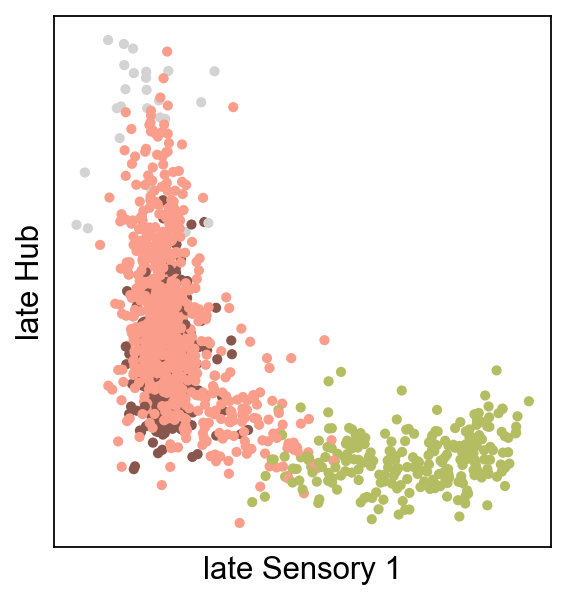

In [34]:
scf.pl.modules(adata,r,mils,module="early",save="bif_sens1_early.pdf")
scf.pl.modules(adata,r,mils,module="late",save="bif_sens1_late.pdf")

In [35]:
kwargs=dict(root_milestone=r,milestones=mils,basis="dendro",
            annot="devtime",frameon=False,tree_behind=True,
            add_outline=True, figsize=(3.8,3),heatmap_space=.2,
            offset_names=.05,linewidth_seg=2,clip_on=False,
            wspace=0.1,ordering="max",style="italic")


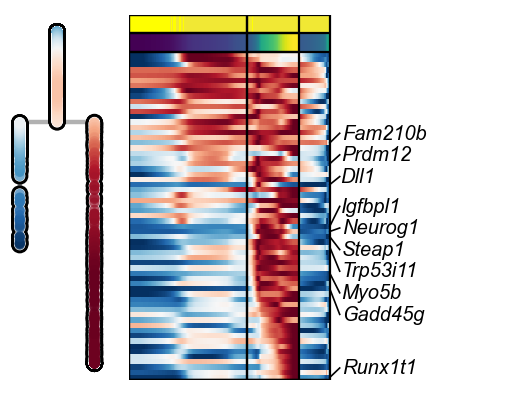

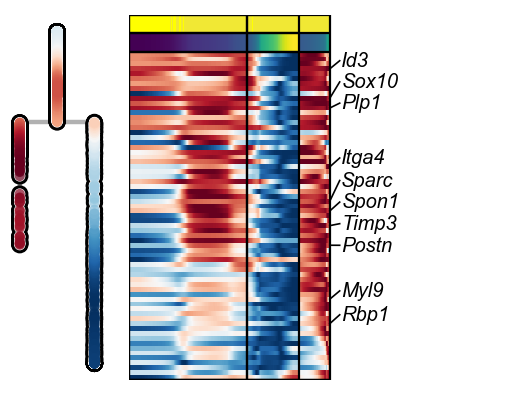

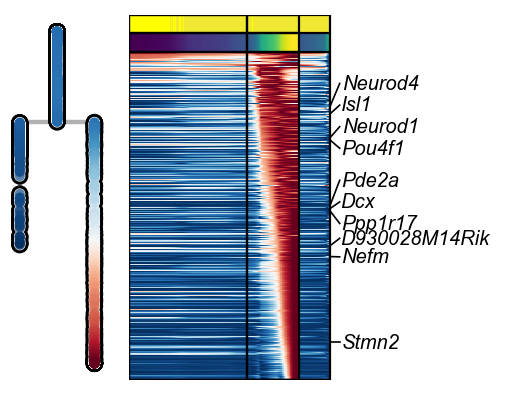

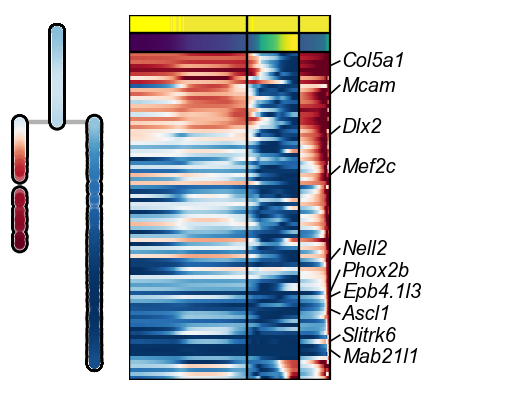

In [36]:
sc.set_figure_params(figsize=(1,4))
scf.pl.trends(adata,**kwargs,module="early",branch=mils[0],save="early_%s.pdf"%mils[0])
scf.pl.trends(adata,**kwargs,module="early",branch=mils[1],save="early_%s.pdf"%mils[1])
scf.pl.trends(adata,**kwargs,module="late",branch=mils[0],save="late_%s.pdf"%mils[0])
scf.pl.trends(adata,**kwargs,module="late",branch=mils[1],save="late_%s.pdf"%mils[1])

In [38]:
sensory1=scf.get.fork_stats(adata,root_milestone=r,milestones=mils)

In [39]:
adata=sc.read("data/adata_bif_sensory2.h5ad")

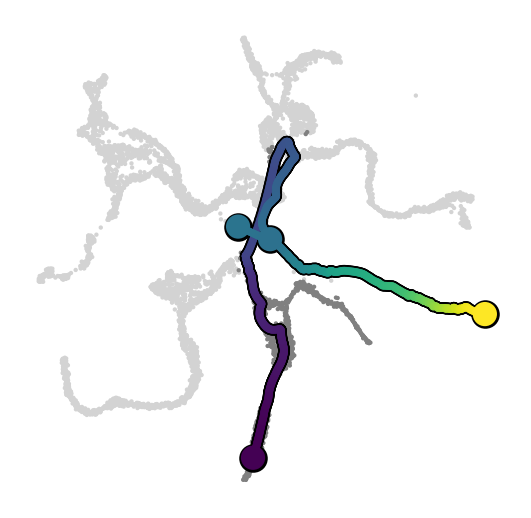

In [40]:
sc.set_figure_params(frameon=False)
ax=sc.pl.umap(adata_all,color="sel",groups="True",show=False,legend_loc="none")
scf.pl.trajectory(adata,alpha=0,ax=ax,scale_path=.7,show=False)
plt.savefig("figures/sens2_bif_sel.pdf",bbox_inches="tight")

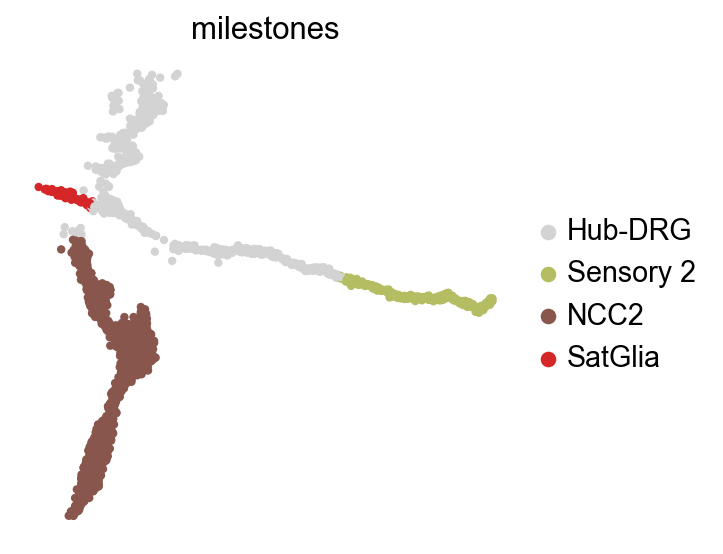

In [41]:
sc.pl.umap(adata,color="milestones",palette=["lightgrey","#B5BD63","#88564C","tab:red"])

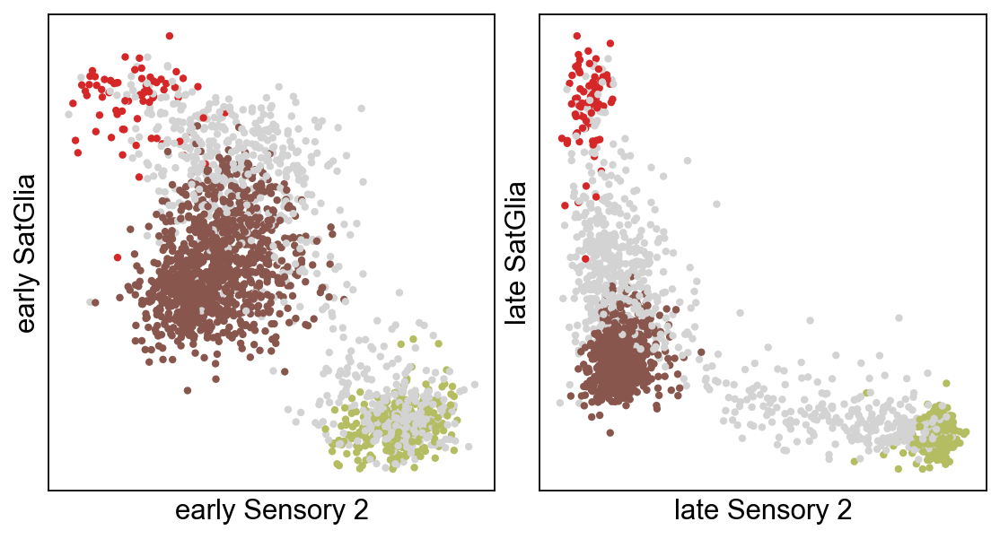

In [42]:
sc.set_figure_params()
r="NCC2"
mils=["Sensory 2","SatGlia"]
scf.pl.modules(adata,r,mils,save="bif_sens2.pdf",)

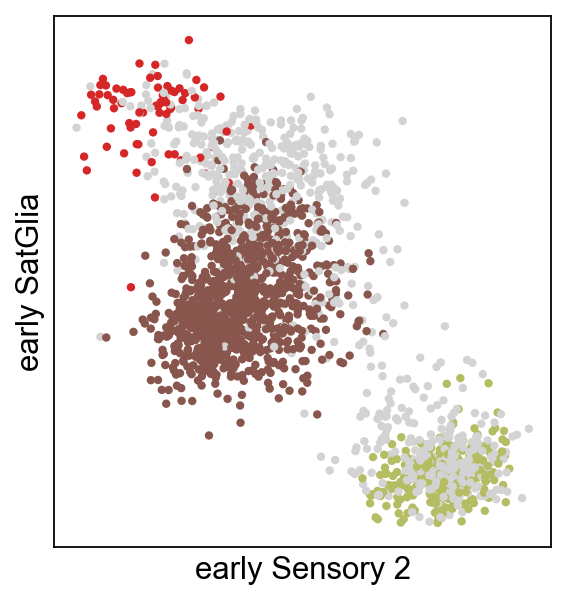

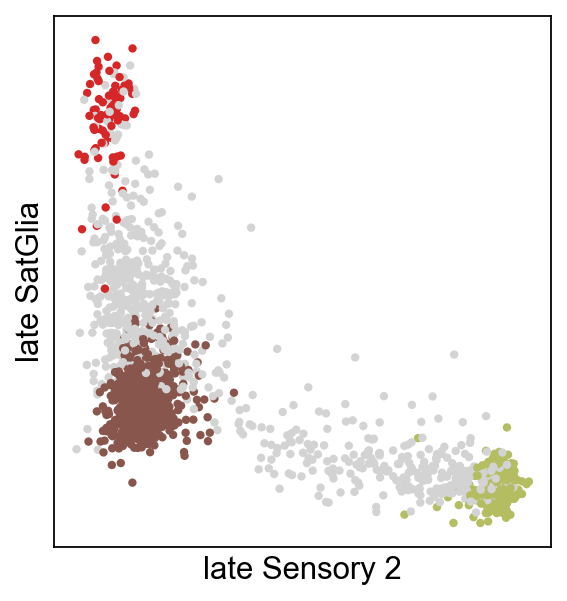

In [43]:
scf.pl.modules(adata,r,mils,module="early",save="bif_sens2_early.pdf")
scf.pl.modules(adata,r,mils,module="late",save="bif_sens2_late.pdf")

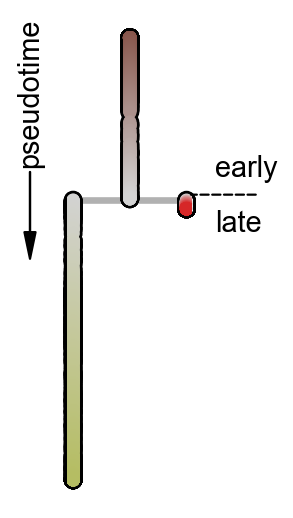

In [44]:
sc.set_figure_params(figsize=(1,4))
ax=scf.pl.dendrogram(adata,color_milestones=True,s=100,frameon=False,
                  add_outline=True,clip_on=False,tree_behind=True,show=False)
ax.annotate("pseudotime",(-.3,.5),(-.3,.7),xycoords="axes fraction",rotation=90,horizontalalignment='center',size=13,
            arrowprops=dict(facecolor="black",width=.1,headwidth=5))


ax.annotate("",(2,-0.0688026),(3.3,-0.0688026),xycoords="data",rotation=90,horizontalalignment='center',size=13,
                arrowprops=dict(facecolor="black",arrowstyle="-",linestyle="--"))

ax.annotate("early",(2,-0.061026),(2.5,-0.061026),xycoords="data",horizontalalignment='left',size=13)

ax.annotate("late",(2,-0.085026),(2.5,-0.085026),xycoords="data",horizontalalignment='left',size=13)

plt.savefig("figures/fig3_bif2miles.pdf")

In [45]:
kwargs["root_milestone"]=r
kwargs["milestones"]=mils

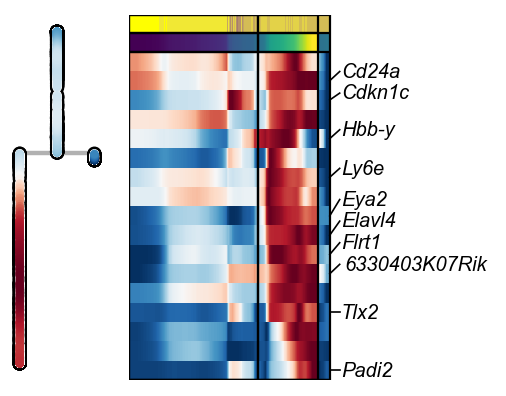

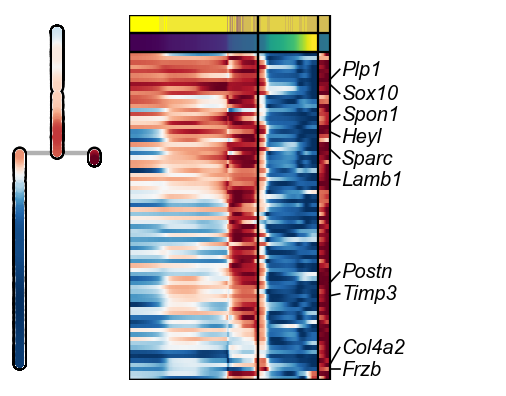

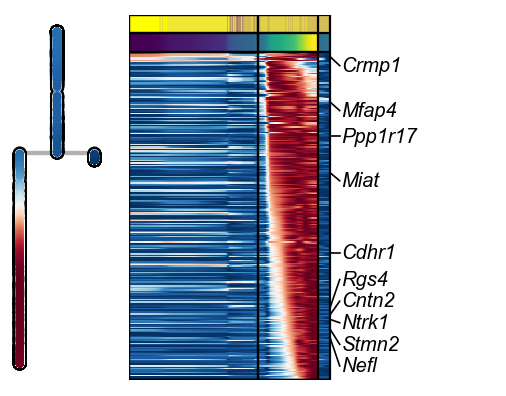

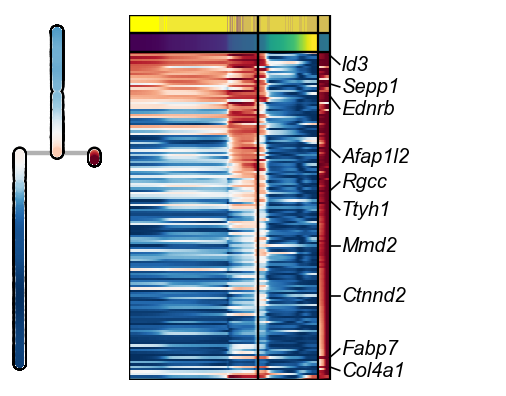

In [46]:
sc.set_figure_params(figsize=(1,4))
scf.pl.trends(adata,**kwargs,module="early",branch=mils[0],save="early_%s.pdf"%mils[0])
scf.pl.trends(adata,**kwargs,module="early",branch=mils[1],save="early_%s.pdf"%mils[1])
scf.pl.trends(adata,**kwargs,module="late",branch=mils[0],save="late_%s.pdf"%mils[0])
scf.pl.trends(adata,**kwargs,module="late",branch=mils[1],save="late_%s.pdf"%mils[1])

In [47]:
sensory2=scf.get.fork_stats(adata,root_milestone=r,milestones=mils)

In [52]:
early_sat=sensory2.index[(sensory2.branch=="SatGlia") & (sensory2.module=="early") ]

In [53]:
early_hub=sensory1.index[(sensory1.branch=="Hub") & (sensory1.module=="early") ]

In [55]:
from matplotlib_venn import venn2
import numpy as np
common=np.intersect1d(early_hub,early_sat)

In [80]:
df=pd.DataFrame(index=early_hub)
df["c"]=1
df
df2=pd.DataFrame(index=early_sat)
df2["c"]=1
df=pd.concat([df,df2],axis=1)==1

In [90]:
all(df.iloc[i,:]==[True,False])

True

In [95]:
len(res)

164

In [96]:
res=[]
for i in range(df.shape[0]):
    if all(df.iloc[i,:]==[True,False]):
        res.append("hub")
    elif all(df.iloc[i,:]==[False,True]):
        res.append("sat glia")
    else:
        res.append("common")

In [100]:
pd.DataFrame(res,index=df.index,columns=["branch"]).to_csv("data/satglia_hub_early.csv")

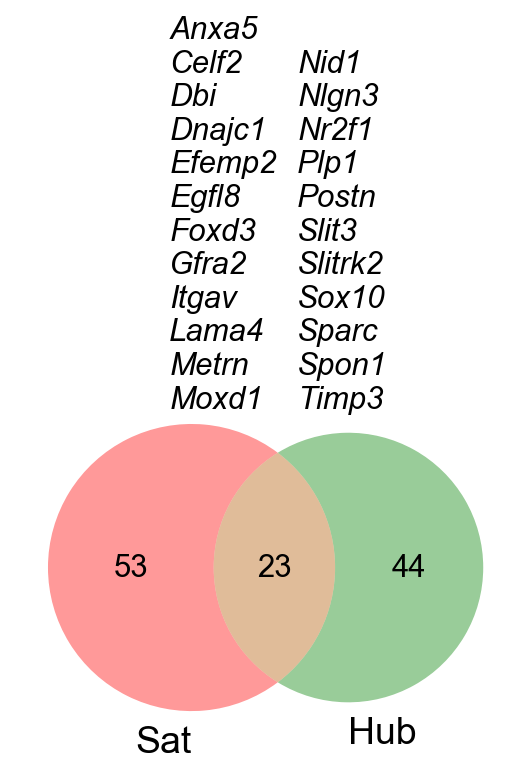

In [101]:
sc.set_figure_params()
venn2([set(early_sat), set(early_hub)],set_labels = ('Sat', 'Hub'))
plt.text(-.3,.5,"\n".join(common[:12]),style="italic")
plt.text(.1,.5,"\n".join(common[12:]),style="italic")
plt.savefig("figures/early_common_satgliahub.pdf")

In [148]:
fname="appendix_9"

In [154]:
%%bash -s $fname
cat<<EOF >$1.tex
\documentclass[11pt]{article}
\usepackage[paperheight=211mm,paperwidth=180mm]{geometry}
 \geometry{
 left=5mm,
 right=5mm,
 top=5mm,
 bottom=5mm,
 }

\usepackage[labelfont=bf]{caption}
\usepackage{multirow}
\usepackage[rgb]{xcolor}
\usepackage{fontspec}
\usepackage[utf8]{inputenc}
\usepackage[T1]{fontenc}
\usepackage{graphicx} 
\begin{document}
\setmainfont{Arial}

\definecolor{Blue}{RGB}{50, 49, 145}

\noindent
\scriptsize 

\raggedright \textbf{A} \textcolor{Blue}{First sensory bifurcation}
\begin{table}[!ht]
\begin{tabular}{cc|cc}
\multirow{3}{*}{\includegraphics[width=0.35\textwidth]{figures/sens1_bif_sel.pdf}} &
  \scriptsize Hub &
  \scriptsize Sensory 1 &
   \tabularnewline
 &
  \includegraphics[trim={0 0 1.5cm 0},width=0.19\textwidth]{figures/trendsearly_Hub.pdf} &
  \includegraphics[trim={0 0 1.5cm 0},width=0.19\textwidth]{figures/trendsearly_Sensory 1.pdf} &
  \includegraphics[trim={-1.5cm 0 0 0},width=.20\textwidth]{figures/modulesbif_sens1_early.pdf} \tabularnewline
 &
  \includegraphics[trim={0 0 1.5cm 0},width=0.19\textwidth]{figures/trendslate_Hub.pdf} &
  \includegraphics[trim={0 0 1.5cm 0},width=0.19\textwidth]{figures/trendslate_Sensory 1.pdf} &
  \includegraphics[trim={-1.5cm 0 0 0},width=.20\textwidth]{figures/modulesbif_sens1_late.pdf}
\end{tabular}
\end{table}

\raggedright \textbf{B} \textcolor{Blue}{Second sensory bifurcation}
\begin{table}[!ht]
\begin{tabular}{cc|cc}
\multirow{3}{*}{\includegraphics[width=0.35\textwidth]{figures/sens2_bif_sel.pdf}} &
  \scriptsize Satelite Glia &
  \scriptsize Sensory 2 &
   \tabularnewline
 &
  \includegraphics[trim={0 0 1.5cm 0},width=0.19\textwidth]{figures/trendsearly_SatGlia.pdf} &
  \includegraphics[trim={0 0 1.5cm 0},width=0.19\textwidth]{figures/trendsearly_Sensory 2.pdf} &
  \includegraphics[trim={-1.5cm 0 0 0},width=.20\textwidth]{figures/modulesbif_sens2_early.pdf} \tabularnewline
 &
  \includegraphics[trim={0 0 1.5cm 0},width=0.19\textwidth]{figures/trendslate_SatGlia.pdf} &
  \includegraphics[trim={0 0 1.5cm 0},width=0.19\textwidth]{figures/trendslate_Sensory 2.pdf} &
  \includegraphics[trim={-1.5cm 0 0 0},width=.20\textwidth]{figures/modulesbif_sens2_late.pdf}
\end{tabular}
\end{table}

\hfill
\clearpage


EOF

echo "\end{document}" >> $1.tex

xelatex --shell-escape $1.tex
rm $1.tex
convert -flatten -density 300 $1.pdf $1.jpg
identify $1.pdf

This is XeTeX, Version 3.14159265-2.6-0.999991 (TeX Live 2019/Debian) (preloaded format=xelatex)
 \write18 enabled.
entering extended mode
(./suppfig4.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size11.clo))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption.sty
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption3.sty))
(/usr/share/texlive/texmf-dist/tex/latex/multirow/multirow.sty)
(/usr/share/texlive/texmf-dist/tex/latex/xcolor/xcolor.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics-cfg/color.cfg)
(/usr/share/texlive/texmf-di

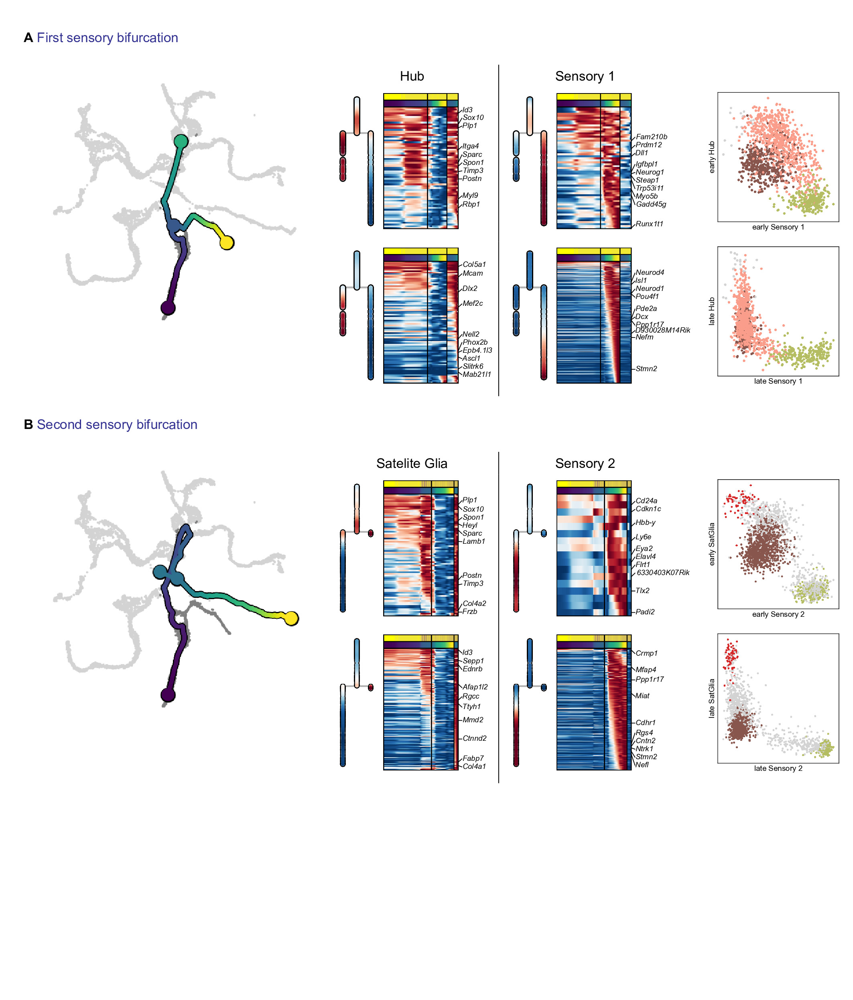

In [155]:
from IPython.display import Image
Image(filename=fname+'.jpg') 

In [41]:
fname="figEV2"

In [50]:
%%bash -s $fname
cat<<EOF >$1.tex
\documentclass{article}
\usepackage[paperheight=180mm,paperwidth=210mm]{geometry}
 \geometry{
 left=5mm,
 right=5mm,
 top=5mm,
 bottom=5mm,
 }

\usepackage[labelfont=bf]{caption}
\usepackage{multirow}
\usepackage[rgb]{xcolor}
\usepackage{fontspec}
\usepackage[utf8]{inputenc}
\usepackage[T1]{fontenc}
\usepackage{graphicx} 
\begin{document}
\setmainfont{Arial}

\definecolor{Blue}{RGB}{50, 49, 145}

\noindent
\large 

\begin{minipage}[t]{0.19\textwidth}
\vspace{0cm}
\includegraphics[width=1\textwidth]{figures/matrixclu0.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{0.19\textwidth}
\vspace{0cm}
\includegraphics[width=1\textwidth]{figures/matrixclu1.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{0.19\textwidth}
\vspace{0cm}
\includegraphics[width=1\textwidth]{figures/matrixclu2.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{0.19\textwidth}
\vspace{0cm}
\includegraphics[width=1\textwidth]{figures/matrixclu3.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{0.19\textwidth}
\vspace{0cm}
\includegraphics[width=1\textwidth]{figures/matrixclu4.pdf}
\end{minipage}\hfill


\hfill
\clearpage


EOF

echo "\end{document}" >> $1.tex

xelatex --shell-escape $1.tex
rm $1.tex
convert -flatten -density 300 $1.pdf $1.jpg
identify $1.pdf

This is XeTeX, Version 3.14159265-2.6-0.999991 (TeX Live 2019/Debian) (preloaded format=xelatex)
 \write18 enabled.
entering extended mode
(./suppfig3.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption.sty
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption3.sty))
(/usr/share/texlive/texmf-dist/tex/latex/multirow/multirow.sty)
(/usr/share/texlive/texmf-dist/tex/latex/xcolor/xcolor.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics-cfg/color.cfg)
(/usr/share/texlive/texmf-di

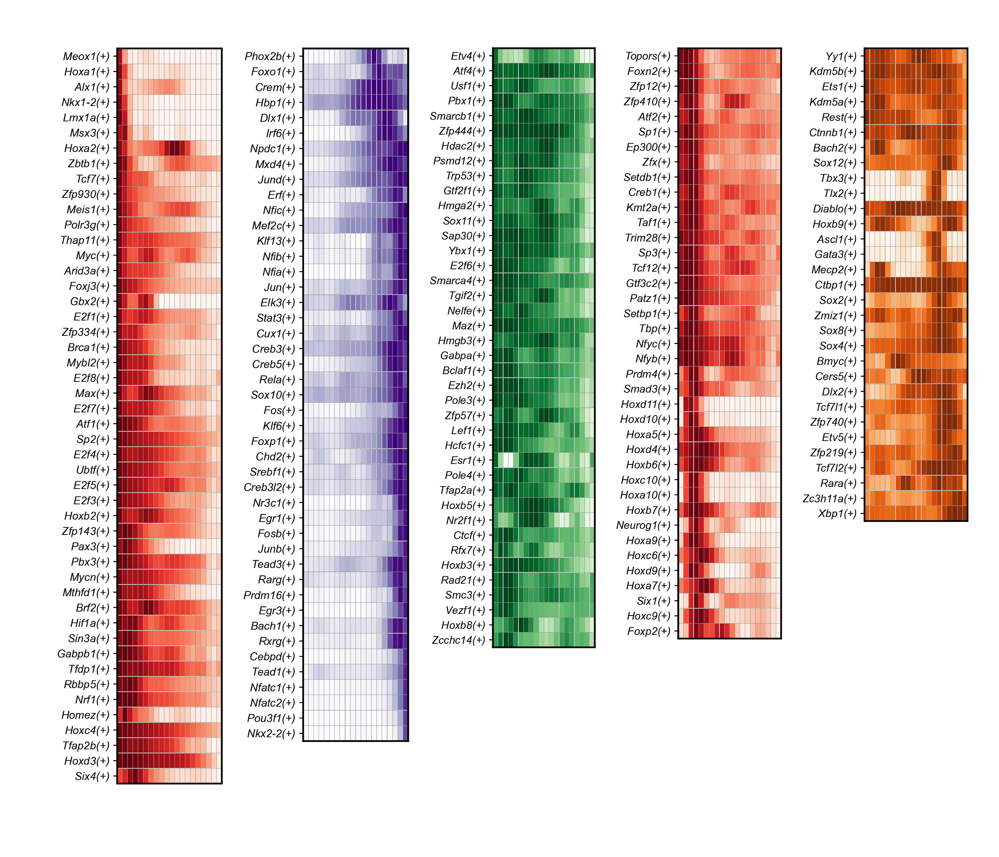

In [51]:
from IPython.display import Image
Image(filename=fname+'.jpg') 